# Predict the close price of S&P500 index by Neural Network

# Import module

In [15]:
import sys, os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pandas import datetime
import math, time
import itertools
from sklearn import preprocessing
import datetime
from sklearn.metrics import mean_squared_error
from math import sqrt
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation
from keras.layers import CuDNNLSTM
from keras.models import load_model
import keras
import pandas_datareader.data as web
import h5py
import tensorflow as tf
from keras.callbacks import *
from keras import regularizers

## Check the device and python version

In [2]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())
print (sys.version)
print(sys.executable)

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 15110458932618415838
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 7640449024
locality {
  bus_id: 1
}
incarnation: 7272124312312497011
physical_device_desc: "device: 0, name: GeForce GTX 1080, pci bus id: 0000:01:00.0, compute capability: 6.1"
]
3.4.3 (default, Nov 17 2016, 01:08:31) 
[GCC 4.8.4]
/home/tonyzhang1231/.virtualenvs/nyse/bin/python


# Input parameters 

In [3]:
stock_name = '^GSPC' # S&P 500 (^GSPC)  index
start = datetime.date(1950, 1, 1)
end = datetime.date.today()

In [4]:
print('startDate: {}, endDate: {}'.format(start, end))

startDate: 1950-01-01, endDate: 2017-11-24


# Part 0. Download data and normalize it
Data since 1950 to today

In [28]:
# 1. use today's data and tomorrow open price to predict tomorrow's close price

def get_stock_data(stock_name, start, end, normalize=True):
    df = web.DataReader(stock_name, "yahoo", start, end)
    print ("origina data\n")
    print (df.head(10))
    
    df.drop(['Close'], 1, inplace=True)
    df['Volume'] = df['Volume'].astype(float)
    df = df[['Open','Volume','High','Low','Adj Close']]

    if normalize:        
        price_scaler = preprocessing.MinMaxScaler()
        price_scaler.fit(df['Open'].values.reshape(-1,1))
        volume_scaler = preprocessing.MinMaxScaler()
        volume_scaler.fit(df['Volume'].values.reshape(-1,1))
        df['Open'] = price_scaler.transform(df.Open.values.reshape(-1,1))
        df['High'] = price_scaler.transform(df.High.values.reshape(-1,1))
        df['Low'] = price_scaler.transform(df.Low.values.reshape(-1,1))
        df['Adj Close'] = price_scaler.transform(df['Adj Close'].values.reshape(-1,1))
        df['Volume'] = volume_scaler.transform(df['Volume'].values.reshape(-1,1))
    return df, price_scaler, volume_scaler


def load_data(df, seq_len):
    amount_of_features = len(df.columns)
    data = df.as_matrix()  # convert dataframe to np array
    sequence_length = seq_len + 1 # index starting from 0
    result = []
    
    for index in range(len(data) - sequence_length): # maxmimum date = lastest date - sequence length
        result.append(data[index: index + sequence_length]) # index : index + 22days
    
    result = np.array(result)
    row = int(round(0.9 * result.shape[0])) # 90% split
    
    # train
    train = result[:row, :] # first 90% date
    X_train = train[:, :-1] # all data until day m

    y_train = train[:, -1][:,-1] # day m + 1 
    
    # test
    test = result[row:, :]
    X_test = test[:, :-1]

    y_test = test[:, -1][:,-1]  # day m + 1 
    
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1] *amount_of_features))
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1] * amount_of_features))  

    return [X_train, y_train, X_test, y_test]

In [29]:
df, price_scaler, volume_scaler = get_stock_data(stock_name, start, end)

origina data

                 Open       High        Low      Close  Adj Close   Volume
Date                                                                      
1950-01-03  16.660000  16.660000  16.660000  16.660000  16.660000  1260000
1950-01-04  16.850000  16.850000  16.850000  16.850000  16.850000  1890000
1950-01-05  16.930000  16.930000  16.930000  16.930000  16.930000  2550000
1950-01-06  16.980000  16.980000  16.980000  16.980000  16.980000  2010000
1950-01-09  17.090000  17.090000  17.080000  17.080000  17.080000  3850000
1950-01-10  17.030001  17.030001  17.030001  17.030001  17.030001  2160000
1950-01-11  17.090000  17.090000  17.090000  17.090000  17.090000  2630000
1950-01-12  16.760000  16.760000  16.760000  16.760000  16.760000  2970000
1950-01-13  16.670000  16.670000  16.670000  16.670000  16.670000  3330000
1950-01-16  16.650000  16.719999  16.650000  16.719999  16.719999  2640000


In [30]:
df.tail(10)

,Open,Volume,High,Low,Adj Close
Date,,,,,
2017-11-10,0.992166,0.304323,0.993571,0.990382,0.992987
2017-11-13,0.990754,0.296992,0.995061,0.989960,0.993970
2017-11-14,0.991226,0.317841,0.991965,0.986895,0.991660
2017-11-15,0.988014,0.310607,0.989326,0.983369,0.986144
2017-11-16,0.989368,0.289116,0.996002,0.989368,0.994280
2017-11-17,0.993235,0.288021,0.993629,0.991176,0.991652
2017-11-20,0.991899,0.262128,0.993893,0.991416,0.992925
2017-11-21,0.995646,0.290863,1.000298,0.995646,0.999462
2017-11-22,0.999957,0.241125,1.000201,0.997991,0.998707


In [31]:
seq_len = 22

X_train, y_train, X_test, y_test = load_data(df, seq_len)

In [32]:
print (X_train.shape)
print (X_test.shape)

(15357, 110)
(1706, 110)


In [33]:
print (y_train.shape)
print (y_test.shape)

(15357,)
(1706,)


### TODO: add More Features here


In [34]:
print (df.count())

Open         17086
Volume       17086
High         17086
Low          17086
Adj Close    17086
dtype: int64


In [35]:
df.tail()

,Open,Volume,High,Low,Adj Close
Date,,,,,
2017-11-17,0.993235,0.288021,0.993629,0.991176,0.991652
2017-11-20,0.991899,0.262128,0.993893,0.991416,0.992925
2017-11-21,0.995646,0.290863,1.000298,0.995646,0.999462
2017-11-22,0.999957,0.241125,1.000201,0.997991,0.998707
2017-11-24,1.000000,0.063510,1.001467,1.000000,1.000774


### Plot out the Normalized Adjusted close price and Return

In [36]:
def plot_close_price(df):
    plt.plot(df['Adj Close'], color='red', label='Adj Close')
    plt.legend(loc='best')
    plt.show()
    
# def plot_return(df):
#     plt.plot(df['DailyReturn'], color='green', label='Daily_Return')
#     plt.legend(loc='best')
#     plt.show()

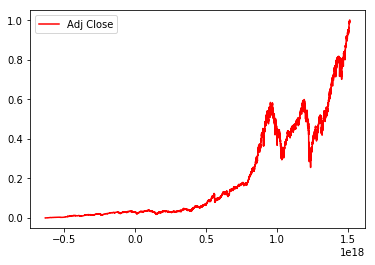

In [37]:
try:
    plot_close_price(df)
except:
    pass

# Part 1. Building LSTM RNN (Base)

In [110]:
def build_model_base(input_shape, neurons, dropout, lr_decay = 0.9, l2_lambda = 0.000001, loadmodelFilepath= None):
    model = Sequential()
    
    model.add(Dense(neurons[0], input_shape = (input_shape,), kernel_initializer="uniform",activation='relu', \
                    kernel_regularizer=regularizers.l2(l2_lambda)))
    
    model.add(Dense(neurons[1], kernel_initializer="uniform",activation='relu', \
                    kernel_regularizer=regularizers.l2(l2_lambda)))
    
    model.add(Dense(neurons[2], kernel_initializer="uniform",activation='relu', \
                    kernel_regularizer=regularizers.l2(l2_lambda)))
        
    model.add(Dense(neurons[3],kernel_initializer="uniform",activation='relu', \
                    kernel_regularizer=regularizers.l2(l2_lambda)))
    model.add(Dropout(dropout))
    
    model.add(Dense(neurons[4],kernel_initializer="uniform",activation='linear'))
    if loadmodelFilepath:
        try:
            model = load_model(loadmodelFilepath)
        except:
            pass
    
    adam = keras.optimizers.Adam(lr= 0.001, decay=lr_decay)
    model.compile(loss='mse',optimizer='adam')
    model.summary()
    return model

###  Model Execution

In [130]:
# callbacks = []
callbacks = [
    ModelCheckpoint(filepath='../NNmodel/baseModel.hdf5', \
                    monitor='val_loss', save_best_only=True, verbose=0, mode= 'auto', period=1),

]

### Parameters

In [131]:
# Parameters : dropout, neurons, epochs, learning rate decay, epochs, seq_len

dropout = 0.1
neurons = [128, 256, 512, 64, 1]
epochs = 1000

shape = X_train.shape[1]
model = build_model_base(shape, neurons, dropout, lr_decay=3)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_39 (Dense)             (None, 128)               14208     
_________________________________________________________________
dense_40 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_41 (Dense)             (None, 512)               131584    
_________________________________________________________________
dense_42 (Dense)             (None, 64)                32832     
_________________________________________________________________
dropout_22 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_43 (Dense)             (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable params: 0
_________________________________________________________________


### Training

In [132]:
history = model.fit(
    X_train,
    y_train,
    batch_size=512,
    epochs=epochs,
    callbacks = callbacks,
    validation_split=0.1,
    verbose=1)

Train on 13821 samples, validate on 1536 samples
Epoch 1/10000
13821/13821 [==============================] - 1s 75us/step - loss: 0.0130 - val_loss: 0.0097
Epoch 2/10000
13821/13821 [==============================] - 0s 7us/step - loss: 0.0011 - val_loss: 0.0035
Epoch 3/10000
13821/13821 [==============================] - 0s 7us/step - loss: 7.2265e-04 - val_loss: 0.0028
Epoch 4/10000
13821/13821 [==============================] - 0s 7us/step - loss: 6.3538e-04 - val_loss: 0.0017
Epoch 5/10000
13821/13821 [==========

### Training loss and val loss along with epochs

In [133]:
def plotTrainTestLoss(history):
    assert isinstance(history, keras.callbacks.History), "input must be a keras.callbacks.History instance"
    train_metrics = history.history
    plt.close('all')
    f, (ax1, ax2) = plt.subplots(2, sharex=True)
    ax1.plot(train_metrics['loss'], color='blue', label='train_loss')
    ax1.legend(loc='best')
    
    ax2.plot(train_metrics['val_loss'], color='red', label='val_loss')
    ax2.legend(loc='best')
    f.subplots_adjust(hspace=0.1)
    plt.xlabel("Epochs")
    plt.show()

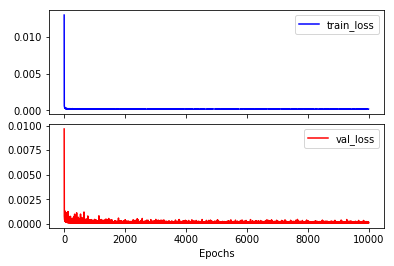

In [134]:
plotTrainTestLoss(history)

### Result on training set and testing set

In [135]:
def model_score(model, X_train, y_train, X_test, y_test):
    trainScore = model.evaluate(X_train, y_train, verbose=0)
    print('Train Score: %.5f MSE (%.5f RMSE)' % (trainScore, math.sqrt(trainScore)))

    testScore = model.evaluate(X_test, y_test, verbose=0)
    print('Test Score: %.5f MSE (%.5f RMSE)' % (testScore, math.sqrt(testScore)))
    return trainScore, testScore

In [136]:
thisBestModel = load_model('../NNmodel/baseModel.hdf5')
model_score(thisBestModel, X_train, y_train, X_test, y_test)
model_score(model, X_train, y_train, X_test, y_test)

Train Score: 0.00003 MSE (0.00547 RMSE)
Test Score: 0.00008 MSE (0.00892 RMSE)
Train Score: 0.00004 MSE (0.00603 RMSE)
Test Score: 0.00017 MSE (0.01287 RMSE)


(3.6371270607610628e-05, 0.00016567339123841398)

### Prediction vs Real results

In [137]:
def getPrediction(model, X_test, y_test, price_scaler=None, denormalize=False):
    p = model.predict(X_test)
    price = None
    if denormalize and price_scaler:
        price = price_scaler.inverse_transform(p)
    
    return p, price

def plot_result(stock_name, normalized_p, normalized_value_y_test):
    plt.plot(normalized_p, color='red', label='Prediction')
    plt.plot(normalized_value_y_test,color='blue', label='Actual')
    plt.legend(loc='best')
    plt.title('The test result for {}'.format(stock_name))
    plt.xlabel('Days')
    plt.ylabel('Adjusted Close')
    plt.show()
    
def plotTrainFitAndTestPrediction(model, X_train, y_train, X_test, y_test):
    p, _ = getPrediction(model, X_test, y_test)
    plot_result(stock_name, p, y_test)
    train_p, _ = getPrediction(model, X_train, y_train)
    plot_result(stock_name, train_p, y_train)

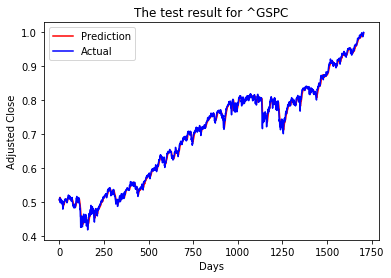

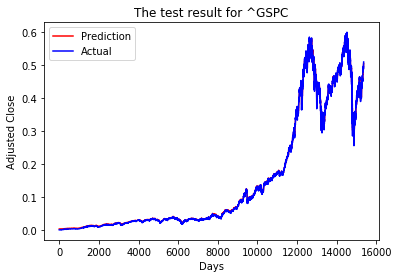

In [138]:
plotTrainFitAndTestPrediction(thisBestModel, X_train, y_train, X_test, y_test)

std of y_test is 0.149733


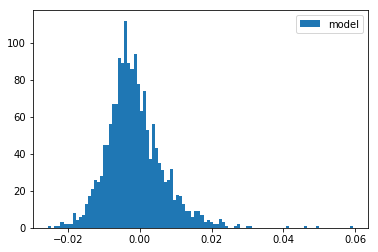

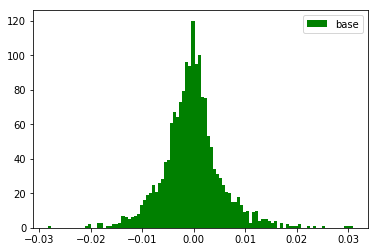

In [151]:
def printHistDiff(model, X_test, y_test):
    print ('std of y_test is {:05f}'.format(np.std(y_test)))
    plt.close('all')
    y_pred = model.predict(X_test).flatten()
    diff = y_pred - y_test
    plt.hist(diff, bins = 100, range = (np.min(diff), np.max(diff)), label = 'model')
    plt.legend(loc='best')
    plt.show()
    plt.close('all')
    base_diff = X_test[:,-1] - y_test
    plt.hist(base_diff, bins = 100, range = (np.min(base_diff), np.max(base_diff)),color = 'green', label = 'base')
    plt.legend(loc='best')
    plt.show()

printHistDiff(thisBestModel, X_test, y_test)

### Save model at last epoch

In [152]:
model.save('../NNmodel/baseModel-epoch:{:02d}.hdf5'.format(epochs))

# Part 2. Fine tune model (Optimization)


In [153]:
# remember we have Parameters : 
# dropout, lr_decay, 
# epochs, seq_len, neurons, 

In [154]:
stock_name = '^GSPC'

# Currently we fix following params, tune dropout, decay, 
seq_len = 22
epochs = 1000
neurons = [128, 256, 512, 64, 1]
shape = X_train.shape[1]

In [155]:
def tuning_model(stock_name, seq_len, dropout, lr_decay, shape, neurons, epochs, X_train, y_train, X_test, y_test):
    model = build_model_base(shape, neurons, dropout, lr_decay, loadmodelFilepath=None)
    
    
    callbacks = [
    ModelCheckpoint(filepath='../NNmodel/optModel-dropout: {:02f}-lr_decay: {:02f}.hdf5'.format(dropout, lr_decay) , \
                    monitor='val_loss', save_best_only=True, verbose=0, mode= 'auto', period=1),

    ]
    
    
    history = model.fit(X_train, y_train,batch_size=512,epochs=epochs,callbacks = callbacks, \
                        validation_split=0.1,verbose=1)
    
    # do some plots
    plotTrainTestLoss(history)
    plotTrainFitAndTestPrediction(model, X_train, y_train, X_test, y_test)
    
    trainScore, testScore = model_score(model, X_train, y_train, X_test, y_test)
    return trainScore, testScore

### Optimial Dropout value

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_44 (Dense)             (None, 128)               14208     
_________________________________________________________________
dense_45 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_46 (Dense)             (None, 512)               131584    
_________________________________________________________________
dense_47 (Dense)             (None, 64)                32832     
_________________________________________________________________
dropout_23 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_48 (Dense)             (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable params: 0
_________________________________________________________________
Trai

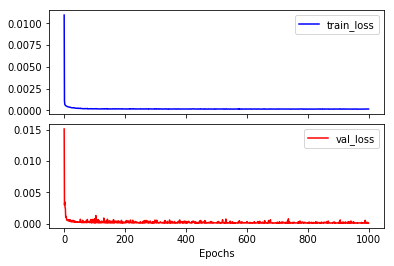

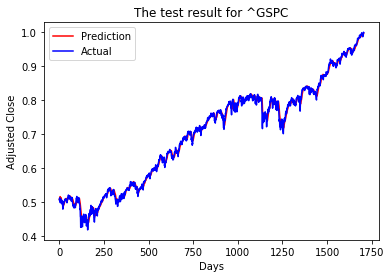

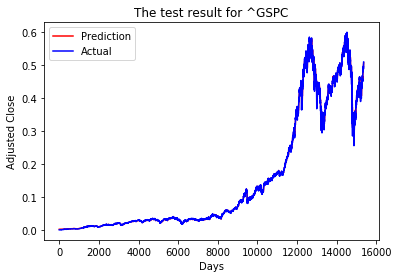

Train Score: 0.00004 MSE (0.00617 RMSE)
Test Score: 0.00010 MSE (0.00990 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_49 (Dense)             (None, 128)               14208     
_________________________________________________________________
dense_50 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_51 (Dense)             (None, 512)               131584    
_________________________________________________________________
dense_52 (Dense)             (None, 64)                32832     
_________________________________________________________________
dropout_24 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_53 (Dense)             (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

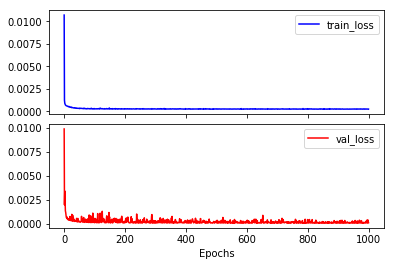

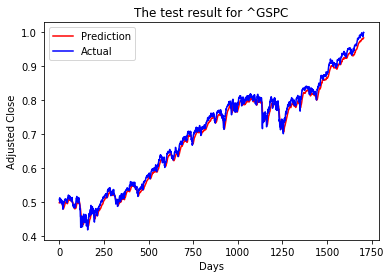

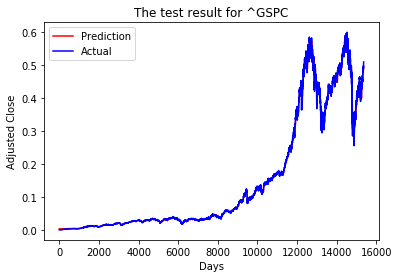

Train Score: 0.00005 MSE (0.00680 RMSE)
Test Score: 0.00021 MSE (0.01447 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_54 (Dense)             (None, 128)               14208     
_________________________________________________________________
dense_55 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_56 (Dense)             (None, 512)               131584    
_________________________________________________________________
dense_57 (Dense)             (None, 64)                32832     
_________________________________________________________________
dropout_25 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_58 (Dense)             (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

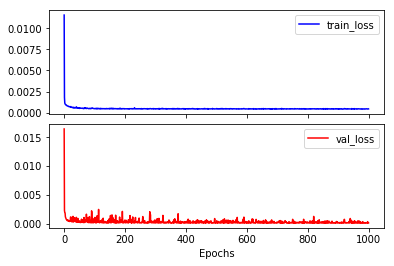

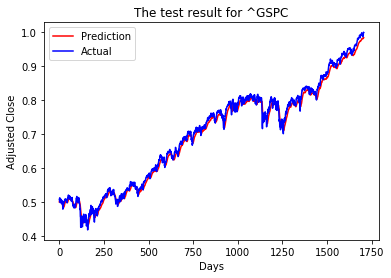

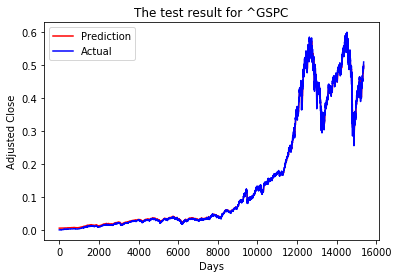

Train Score: 0.00005 MSE (0.00710 RMSE)
Test Score: 0.00019 MSE (0.01366 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_59 (Dense)             (None, 128)               14208     
_________________________________________________________________
dense_60 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_61 (Dense)             (None, 512)               131584    
_________________________________________________________________
dense_62 (Dense)             (None, 64)                32832     
_________________________________________________________________
dropout_26 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_63 (Dense)             (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

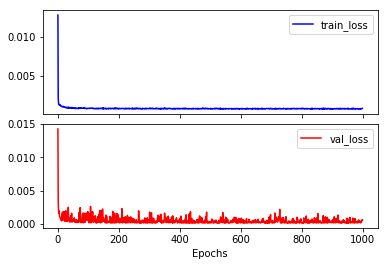

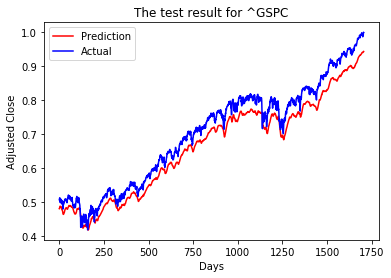

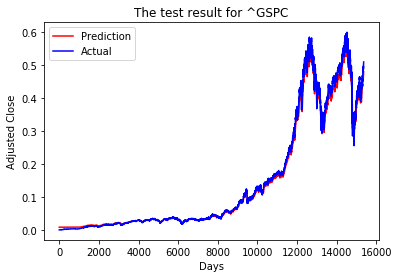

Train Score: 0.00018 MSE (0.01341 RMSE)
Test Score: 0.00153 MSE (0.03916 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_64 (Dense)             (None, 128)               14208     
_________________________________________________________________
dense_65 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_66 (Dense)             (None, 512)               131584    
_________________________________________________________________
dense_67 (Dense)             (None, 64)                32832     
_________________________________________________________________
dropout_27 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_68 (Dense)             (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

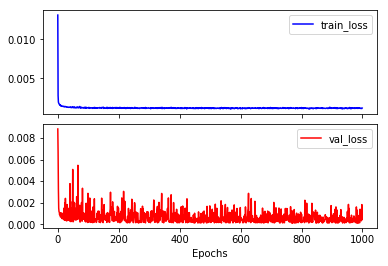

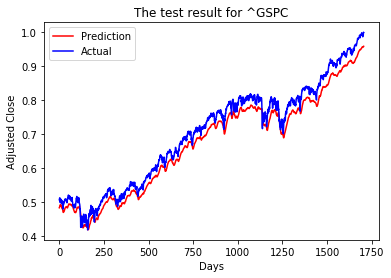

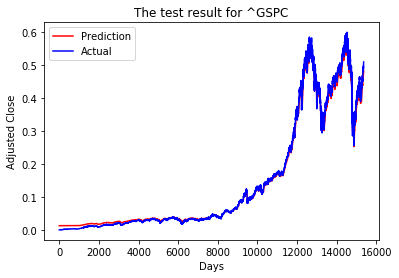

Train Score: 0.00012 MSE (0.01115 RMSE)
Test Score: 0.00092 MSE (0.03027 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_69 (Dense)             (None, 128)               14208     
_________________________________________________________________
dense_70 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_71 (Dense)             (None, 512)               131584    
_________________________________________________________________
dense_72 (Dense)             (None, 64)                32832     
_________________________________________________________________
dropout_28 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_73 (Dense)             (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

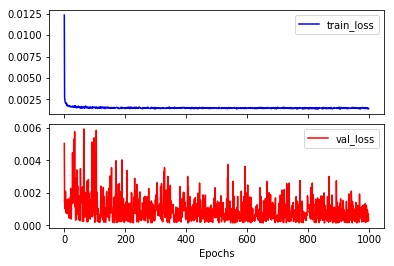

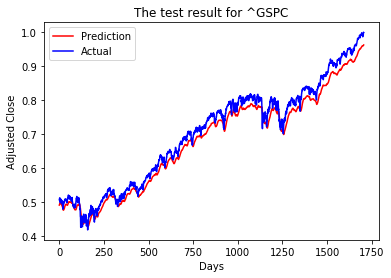

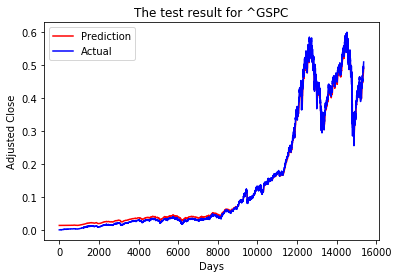

Train Score: 0.00013 MSE (0.01126 RMSE)
Test Score: 0.00066 MSE (0.02568 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_74 (Dense)             (None, 128)               14208     
_________________________________________________________________
dense_75 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_76 (Dense)             (None, 512)               131584    
_________________________________________________________________
dense_77 (Dense)             (None, 64)                32832     
_________________________________________________________________
dropout_29 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_78 (Dense)             (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

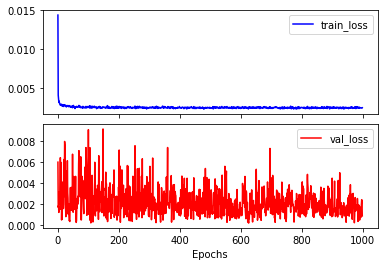

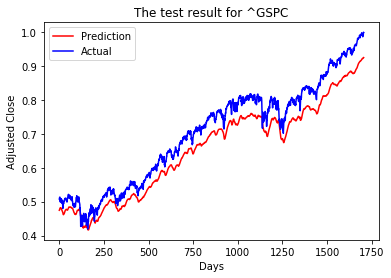

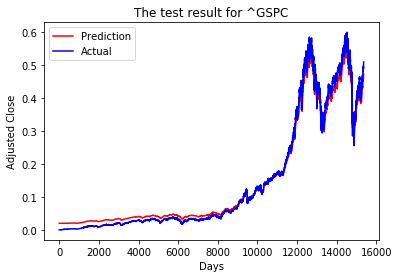

Train Score: 0.00031 MSE (0.01761 RMSE)
Test Score: 0.00252 MSE (0.05019 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_79 (Dense)             (None, 128)               14208     
_________________________________________________________________
dense_80 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_81 (Dense)             (None, 512)               131584    
_________________________________________________________________
dense_82 (Dense)             (None, 64)                32832     
_________________________________________________________________
dropout_30 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_83 (Dense)             (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

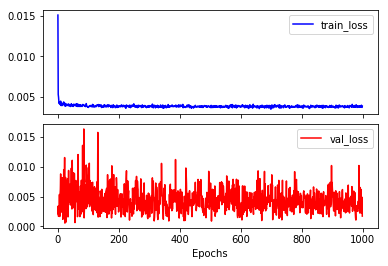

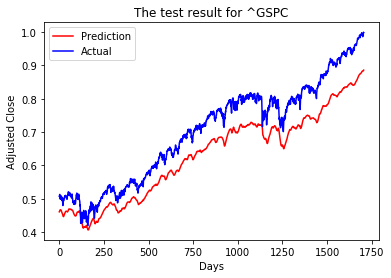

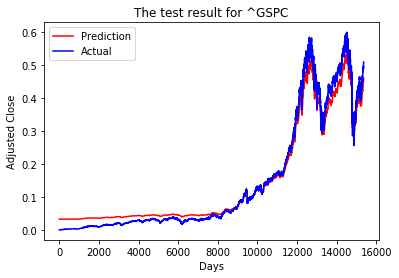

Train Score: 0.00064 MSE (0.02528 RMSE)
Test Score: 0.00566 MSE (0.07521 RMSE)


In [156]:
dropout_list = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
dropout_result = {}
lr_decay = 3

for dropout in dropout_list:    
    trainScore, testScore = tuning_model(stock_name, seq_len, dropout, lr_decay, shape, neurons, epochs,\
                                          X_train, y_train, X_test, y_test)
    dropout_result[dropout] = [trainScore, testScore]

In [157]:
print (dropout_result)
minv = dropout_result[0.1][1]
opt_dropout = 0.1
for k,v in dropout_result.items():
    if v[1] < minv:
        opt_dropout = k
        minv = v[1]
        
opt_dropout
        
    

# min_val = min(dropout_result.values())
# min_val_key = [k for k, v in dropout_result.items() if v == min_val]
# print (dropout_result)
# print (min_val_key)

# opt_dropout = min_val_key[0]

{0.1: [3.8120199277066698e-05, 9.7958279377228125e-05], 0.2: [4.6214082786151017e-05, 0.00020941031755481552], 0.3: [5.0398283759577163e-05, 0.0001865240439297937], 0.6: [0.00012677382791949804, 0.00065962271423680664], 0.8: [0.00063908584358148435, 0.0056562973590347163], 0.5: [0.00012434287917507757, 0.00091600571682617709], 0.7: [0.00031019497235297301, 0.0025186641098099466], 0.4: [0.00017993768043589279, 0.0015333646865821457]}


0.1

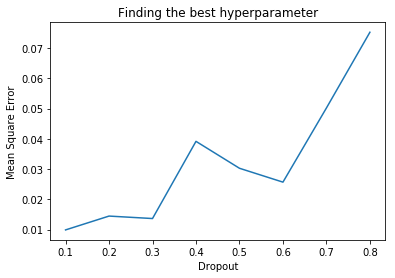

In [158]:
lists = sorted(dropout_result.items())
x,y = zip(*lists)
y = [math.sqrt(z[1]) for z in y]
plt.plot(x,y)
plt.title('Finding the best hyperparameter')
plt.xlabel('Dropout')
plt.ylabel('Mean Square Error')
plt.show()

### Optimal lr_decay

In [159]:
lr_decay_list = [1,2,3,4,5,6,7,8,9]
lr_decay_result = {}
opt_dropout = opt_dropout

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_84 (Dense)             (None, 128)               14208     
_________________________________________________________________
dense_85 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_86 (Dense)             (None, 512)               131584    
_________________________________________________________________
dense_87 (Dense)             (None, 64)                32832     
_________________________________________________________________
dropout_31 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_88 (Dense)             (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable params: 0
_________________________________________________________________
Trai

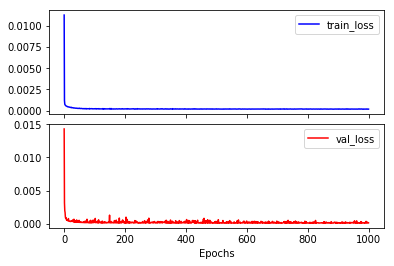

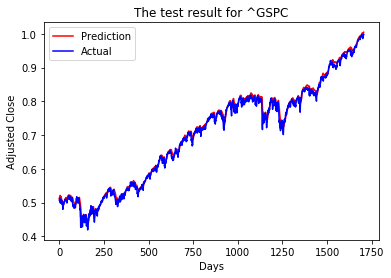

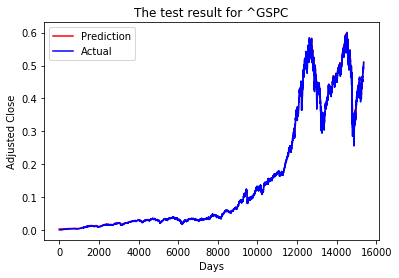

Train Score: 0.00004 MSE (0.00668 RMSE)
Test Score: 0.00014 MSE (0.01186 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_89 (Dense)             (None, 128)               14208     
_________________________________________________________________
dense_90 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_91 (Dense)             (None, 512)               131584    
_________________________________________________________________
dense_92 (Dense)             (None, 64)                32832     
_________________________________________________________________
dropout_32 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_93 (Dense)             (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

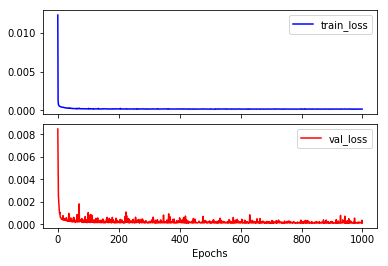

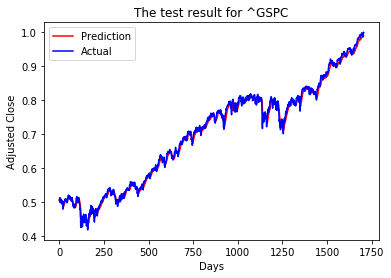

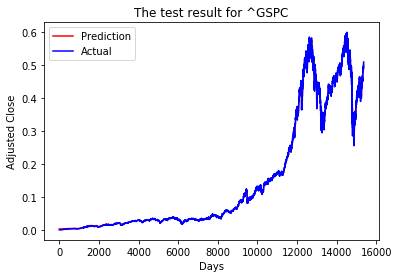

Train Score: 0.00004 MSE (0.00625 RMSE)
Test Score: 0.00012 MSE (0.01106 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_94 (Dense)             (None, 128)               14208     
_________________________________________________________________
dense_95 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_96 (Dense)             (None, 512)               131584    
_________________________________________________________________
dense_97 (Dense)             (None, 64)                32832     
_________________________________________________________________
dropout_33 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_98 (Dense)             (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

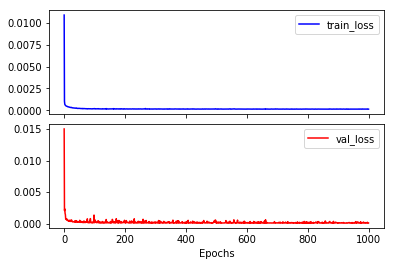

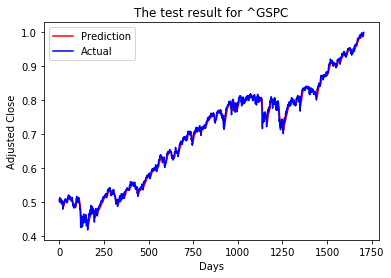

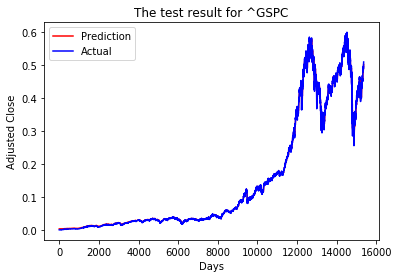

Train Score: 0.00004 MSE (0.00610 RMSE)
Test Score: 0.00011 MSE (0.01025 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_99 (Dense)             (None, 128)               14208     
_________________________________________________________________
dense_100 (Dense)            (None, 256)               33024     
_________________________________________________________________
dense_101 (Dense)            (None, 512)               131584    
_________________________________________________________________
dense_102 (Dense)            (None, 64)                32832     
_________________________________________________________________
dropout_34 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_103 (Dense)            (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

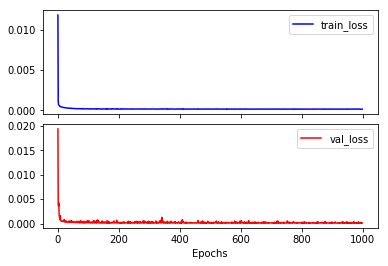

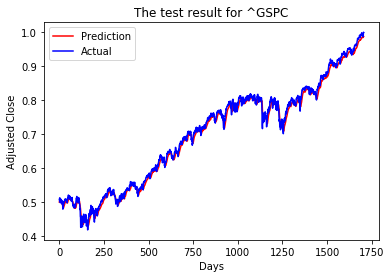

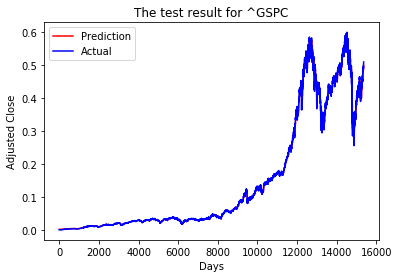

Train Score: 0.00004 MSE (0.00626 RMSE)
Test Score: 0.00015 MSE (0.01215 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_104 (Dense)            (None, 128)               14208     
_________________________________________________________________
dense_105 (Dense)            (None, 256)               33024     
_________________________________________________________________
dense_106 (Dense)            (None, 512)               131584    
_________________________________________________________________
dense_107 (Dense)            (None, 64)                32832     
_________________________________________________________________
dropout_35 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_108 (Dense)            (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

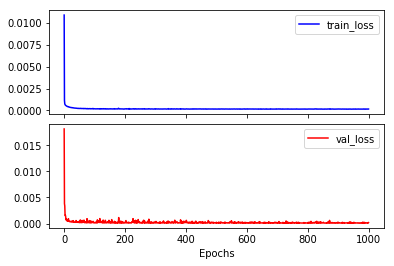

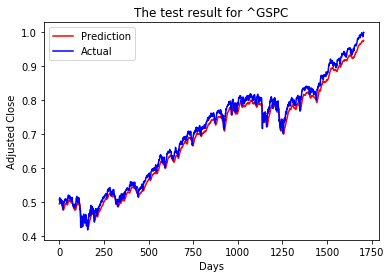

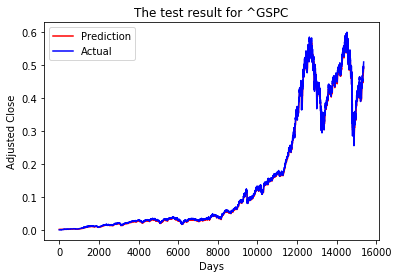

Train Score: 0.00006 MSE (0.00774 RMSE)
Test Score: 0.00034 MSE (0.01851 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_109 (Dense)            (None, 128)               14208     
_________________________________________________________________
dense_110 (Dense)            (None, 256)               33024     
_________________________________________________________________
dense_111 (Dense)            (None, 512)               131584    
_________________________________________________________________
dense_112 (Dense)            (None, 64)                32832     
_________________________________________________________________
dropout_36 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_113 (Dense)            (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

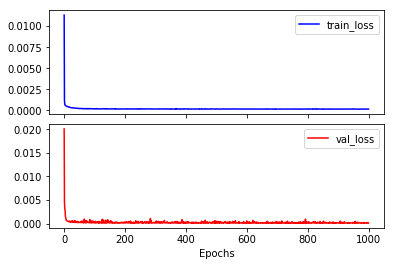

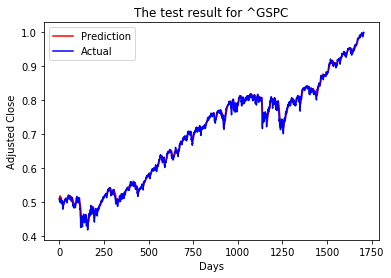

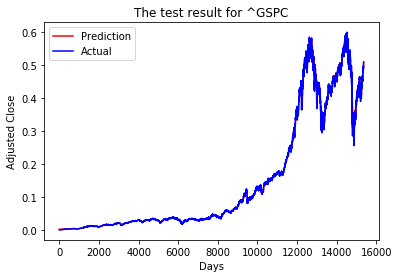

Train Score: 0.00004 MSE (0.00633 RMSE)
Test Score: 0.00010 MSE (0.01012 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_114 (Dense)            (None, 128)               14208     
_________________________________________________________________
dense_115 (Dense)            (None, 256)               33024     
_________________________________________________________________
dense_116 (Dense)            (None, 512)               131584    
_________________________________________________________________
dense_117 (Dense)            (None, 64)                32832     
_________________________________________________________________
dropout_37 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_118 (Dense)            (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

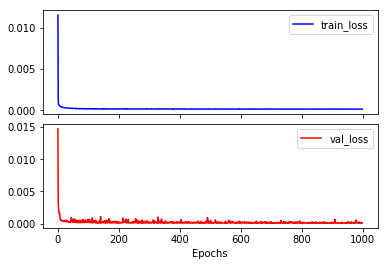

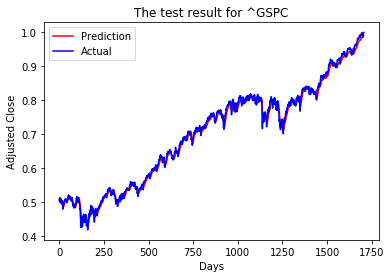

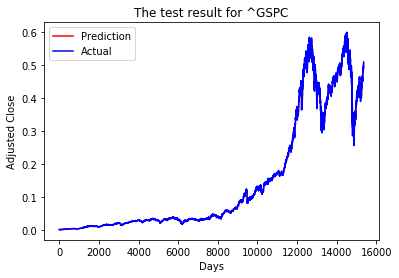

Train Score: 0.00004 MSE (0.00633 RMSE)
Test Score: 0.00012 MSE (0.01115 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_119 (Dense)            (None, 128)               14208     
_________________________________________________________________
dense_120 (Dense)            (None, 256)               33024     
_________________________________________________________________
dense_121 (Dense)            (None, 512)               131584    
_________________________________________________________________
dense_122 (Dense)            (None, 64)                32832     
_________________________________________________________________
dropout_38 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_123 (Dense)            (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

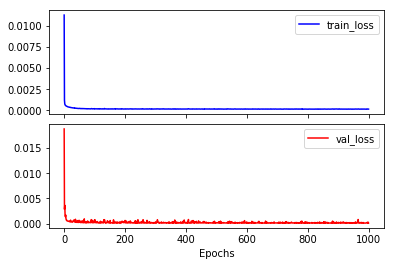

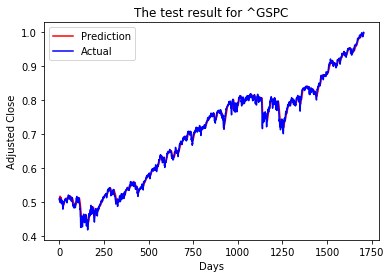

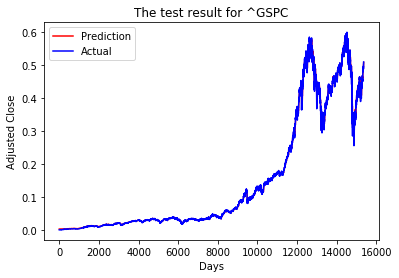

Train Score: 0.00004 MSE (0.00627 RMSE)
Test Score: 0.00010 MSE (0.01002 RMSE)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_124 (Dense)            (None, 128)               14208     
_________________________________________________________________
dense_125 (Dense)            (None, 256)               33024     
_________________________________________________________________
dense_126 (Dense)            (None, 512)               131584    
_________________________________________________________________
dense_127 (Dense)            (None, 64)                32832     
_________________________________________________________________
dropout_39 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_128 (Dense)            (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable p

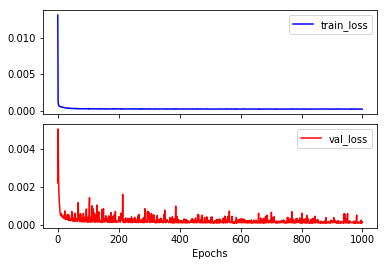

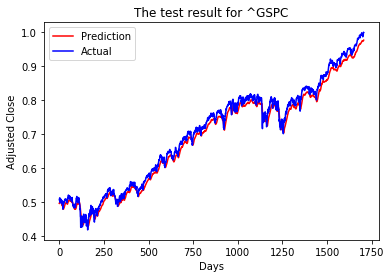

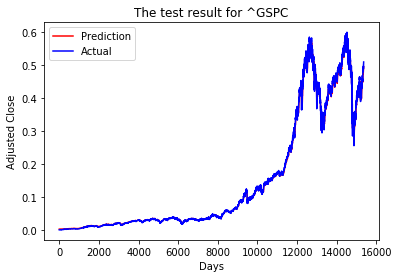

Train Score: 0.00006 MSE (0.00746 RMSE)
Test Score: 0.00031 MSE (0.01760 RMSE)


In [160]:
for lr_decay in lr_decay_list:    
    trainScore, testScore = tuning_model(stock_name, seq_len, opt_dropout, lr_decay, shape, neurons, epochs,\
                                          X_train, y_train, X_test, y_test)
    lr_decay_result[lr_decay] = [trainScore, testScore]

In [162]:
print (lr_decay_result)
minv = lr_decay_result[1][1]
opt_lr_decay = 1
for k,v in lr_decay_result.items():
    if v[1] < minv:
        opt_lr_decay = k
        minv = v[1]
        
opt_lr_decay

{1: [4.4689189570750589e-05, 0.00014077462636044626], 2: [3.9023799764284829e-05, 0.00012230200913490713], 3: [3.7159963240837442e-05, 0.00010500706130646089], 4: [3.9237482601889458e-05, 0.00014755092877361014], 5: [5.9913701061076291e-05, 0.00034245397225606439], 6: [4.0050077102928342e-05, 0.00010250666876751582], 7: [4.0068018279981881e-05, 0.00012429812621629055], 8: [3.9345666506413534e-05, 0.00010046806111937943], 9: [5.5685016013254463e-05, 0.00030969492550655448]}


8

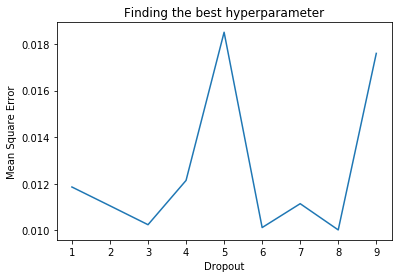

In [163]:
lists = sorted(lr_decay_result.items())
x,y = zip(*lists)
y = [math.sqrt(z[1]) for z in y]
plt.plot(x,y)
plt.title('Finding the best hyperparameter')
plt.xlabel('Dropout')
plt.ylabel('Mean Square Error')
plt.show()

# Show the best result

In [164]:
print (opt_dropout)
print (opt_lr_decay)

0.1
8


In [165]:
best_model = load_model('../NNmodel/optModel-dropout: 0.100000-lr_decay: 8.000000.hdf5')
model_score(best_model, X_train, y_train, X_test, y_test)

Train Score: 0.00004 MSE (0.00613 RMSE)
Test Score: 0.00010 MSE (0.00997 RMSE)


(3.7541981281139954e-05, 9.9425429098470763e-05)

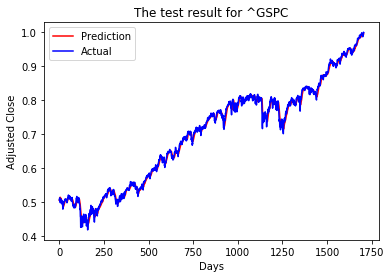

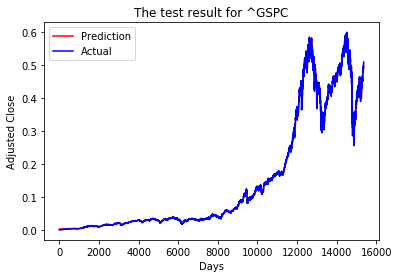

In [166]:
plotTrainFitAndTestPrediction(best_model, X_train, y_train, X_test, y_test)

### Compare with naive result (close price of last day)

In [167]:
def rmse(pred, truth, firstk = None):
    firstk = firstk or pred.shape[0]
    return np.sqrt(np.mean( (pred[:firstk+1]-truth[:firstk+1])**2))

In [168]:
pred = best_model.predict(X_test).flatten()

In [169]:
rmse(pred, y_test)

0.0089338462456229097

In [171]:
naive = X_test[:,-1]

In [172]:
rmse(naive, y_test)

0.0057772929707193433

In [173]:
df = pd.DataFrame([y_test,naive,pred]).T
df.columns = ['y_test','naive','pred']

In [175]:
df.head(10)

,y_test,naive,pred
0,0.507537,0.509206,0.506156
1,0.510754,0.507537,0.506536
2,0.512344,0.510754,0.509678
3,0.513343,0.512344,0.511721
4,0.502672,0.513343,0.514578
5,0.499561,0.502672,0.514884
6,0.499058,0.499561,0.513756
7,0.504391,0.499058,0.512726
8,0.507232,0.504391,0.509678
9,0.499147,0.507232,0.511391


### Resume training the optimal model

In [212]:
def loadModel(loadmodelFilepath , lr_decay = 10):
    try:
        model = load_model(loadmodelFilepath)
        adam = keras.optimizers.Adam(lr= 1e-10, decay=lr_decay)
        model.compile(loss='mse',optimizer='adam')
        model.summary()
        return model
    except:
        pass

In [213]:
newModel = loadModel("../NNmodel/optModel-dropout: 0.100000-lr_decay: 8.000000.hdf5")

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_119 (Dense)            (None, 128)               14208     
_________________________________________________________________
dense_120 (Dense)            (None, 256)               33024     
_________________________________________________________________
dense_121 (Dense)            (None, 512)               131584    
_________________________________________________________________
dense_122 (Dense)            (None, 64)                32832     
_________________________________________________________________
dropout_38 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_123 (Dense)            (None, 1)                 65        
Total params: 211,713
Trainable params: 211,713
Non-trainable params: 0
_________________________________________________________________


In [216]:
callbacks = [
    ModelCheckpoint(filepath='../NNmodel/furtherTrainedModel.hdf5', \
                    monitor='val_loss', save_best_only=True, verbose=0, mode= 'auto', period=1),

]

history = newModel.fit(X_train, y_train,batch_size=512,epochs=1000, validation_split=0.1,verbose=1, callbacks=callbacks)

Train on 13821 samples, validate on 1536 samples
Epoch 1/1000
13821/13821 [==============================] - 0s 9us/step - loss: 1.6005e-04 - val_loss: 1.2561e-04
Epoch 2/1000
13821/13821 [==============================] - 0s 8us/step - loss: 1.5297e-04 - val_loss: 9.9089e-05
Epoch 3/1000
13821/13821 [==============================] - 0s 7us/step - loss: 1.5513e-04 - val_loss: 1.3902e-04
Epoch 4/1000
13821/13821 [==============================] - 0s 8us/step - loss: 1.4300e-04 - val_loss: 9.4250e-05
Epoch 5/1000
13821/

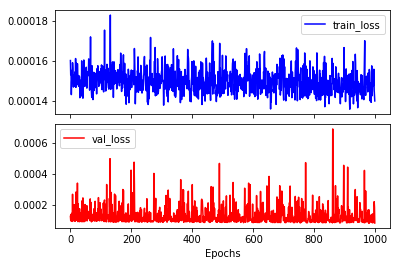

Train Score: 0.00003 MSE (0.00574 RMSE)
Test Score: 0.00009 MSE (0.00934 RMSE)


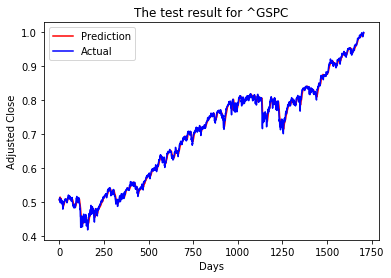

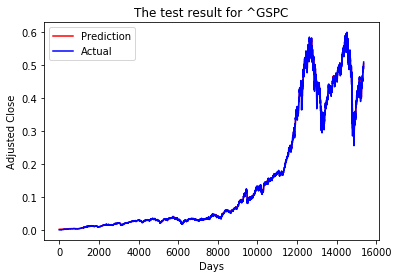

In [217]:
plotTrainTestLoss(history)
thisBestModel = load_model('../NNmodel/furtherTrainedModel.hdf5')
model_score(thisBestModel, X_train, y_train, X_test, y_test)
plotTrainFitAndTestPrediction(thisBestModel, X_train, y_train, X_test, y_test)

# Get a slightly better result, but still worse than naive result

# TODO: add more features to improve the result